In [1]:
import numpy as np
import pandas as pd
import os
import glob
import cv2
import math
import seaborn as sns
import json

sns.set()
sns.set_palette("husl")

Introduction

This will be a short exploratory analysis with the goal of becoming more familiar with the 2018 Data Science Bowl dataset and identifying some possible hurdles that could have a negative effect on model performance.

Contents:

    Importing and processing image data
    Looking at the image metadata summary statistics
    Plotting image width, height and area distributions
    Plotting number of nuclei per image distribution
    Plotting images with the most and fewest nuclei
    Plotting the smallest and largest nuclei
    Plotting a sample of images
    Conclusion

In [2]:
TRAIN_PATH = './stage1_train/'
TEST_PATH = './stage1_test/'

RANDOM_SEED=75

OUTPUT_PATH = './'
CONTOUR_EXTRACT_MODE = cv2.RETR_TREE

In [3]:

train_ids = [x for x in os.listdir(TRAIN_PATH) if os.path.isdir(TRAIN_PATH+x)]
test_ids = [x for x in os.listdir(TEST_PATH) if os.path.isdir(TEST_PATH+x)]

In [4]:

df = pd.DataFrame({'id':train_ids,'train_or_test':'train'})
df = df.append(pd.DataFrame({'id':test_ids,'train_or_test':'test'}))

df.groupby(['train_or_test']).count()

,id
train_or_test,
test,65
train,670


In [12]:
df['path'] = df.apply(lambda x:'./stage1_{}/{}/images/{}.png'.format(x[1],x[0],x[0]), 
                      axis=1)

In [17]:
df.head()

,id,train_or_test,path,height,width,bg_red,bg_green,bg_blue,bg_color,fg_red,fg_green,fg_blue,fg_color,bg_color_pct,fg_color_pct,invert,shape
0,00071198d059ba7f5914a526d124d28e6d010c92466da2...,train,./stage1_train/00071198d059ba7f5914a526d124d28...,256,256,3.452972,3.452972,3.452972,3.452972,45.737764,45.737764,45.737764,45.737764,0.936401,0.063599,False,0256x0256
1,003cee89357d9fe13516167fd67b609a164651b2193458...,train,./stage1_train/003cee89357d9fe13516167fd67b609...,256,256,5.178046,5.178046,5.178046,5.178046,61.447798,61.447798,61.447798,61.447798,0.931747,0.068253,False,0256x0256
2,00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b074...,train,./stage1_train/00ae65c1c6631ae6f2be1a449902976...,256,320,199.839010,193.084331,206.837755,199.920366,129.219090,71.296901,163.549962,121.355318,0.681055,0.318945,True,0256x0320
3,0121d6759c5adb290c8e828fc882f37dfaf3663ec885c6...,train,./stage1_train/0121d6759c5adb290c8e828fc882f37...,256,320,193.912356,197.166728,211.211233,200.763439,138.920985,91.876245,186.731012,139.176081,0.732996,0.267004,True,0256x0320
4,01d44a26f6680c42ba94c9bc6339228579a95d0e2695b1...,train,./stage1_train/01d44a26f6680c42ba94c9bc6339228...,256,320,179.135914,159.844760,201.238046,180.072907,121.982795,80.364095,191.996003,131.447631,0.929785,0.070215,True,0256x0320


In [14]:
from sklearn.cluster import KMeans

def centroid_histogram(clt):
    # grab the number of different clusters and create a histogram
    # based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)

    # normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()

    # return the histogram
    return hist

In [15]:


def get_image_info(path, clusters=2):
    image = cv2.imread(path)
    height,width,_ = image.shape
    image = cv2.cvtColor(image, cv2.COLOR_BGRA2RGB)
    image = image.reshape((image.shape[0] * image.shape[1], 3))
    clt = KMeans(n_clusters = clusters)
    clt.fit(image)
    hist = centroid_histogram(clt)
    
    bg_idx, fg_idx = 0, clusters-1
    if hist[bg_idx] < hist[fg_idx]:
        bg_idx, fg_idx = clusters-1, 0
    
    bg_red, bg_green, bg_blue = clt.cluster_centers_[bg_idx]
    fg_red, fg_green, fg_blue = clt.cluster_centers_[fg_idx]
    
    bg_color = sum(clt.cluster_centers_[bg_idx])/3
    fg_color = sum(clt.cluster_centers_[fg_idx])/3
    max_color_pct = hist[bg_idx]
    min_color_pct = hist[fg_idx]
    
    return (pd.Series([height,width,
                       bg_red, bg_green, bg_blue, bg_color,
                       fg_red, fg_green, fg_blue, fg_color,
                       hist[bg_idx],hist[fg_idx],
                       fg_color < bg_color]))

In [16]:
image_info = os.path.join(OUTPUT_PATH,'images.json')

if os.path.isfile(image_info):
    with open(image_info, 'r') as datafile:
        data = json.load(datafile)
        df = pd.read_json(path_or_buf=data, orient='records')
        data = None
else:
    names = ['height','width',
             'bg_red', 'bg_green', 'bg_blue','bg_color',
             'fg_red', 'fg_green', 'fg_blue','fg_color',
             'bg_color_pct','fg_color_pct','invert']

    df[names] = df['path'].apply(lambda x: get_image_info(x))
    df['shape'] = df[['height','width']].apply(lambda x: '{:04d}x{:04d}'.format(x[0], x[1]), axis=1)

    with open(image_info, 'w') as outfile:
        json.dump(df.to_json(orient='records'), outfile)

In [18]:
len(df['shape'].unique()),len(df['width'].unique()), len(df['height'].unique())

(16, 15, 11)

In [19]:
%matplotlib inline
from matplotlib import pyplot as plt

In [20]:
agg = df[['shape','train_or_test','id']].groupby(['shape','train_or_test']).count().unstack()
agg.columns = agg.columns.droplevel()

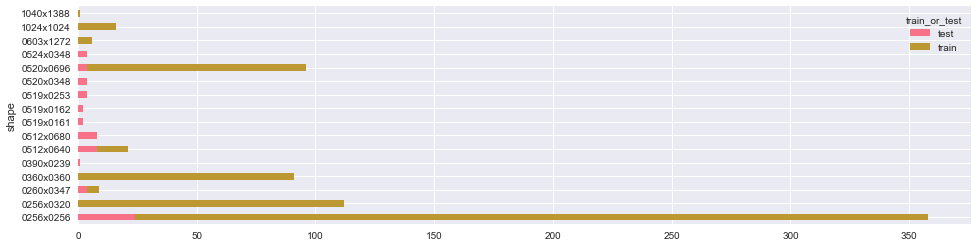

In [21]:
agg.plot.barh(stacked=True,figsize=(16,4))
plt.show()

In [22]:
agg[agg['train'].isnull()]

train_or_test,test,train
shape,,
0390x0239,1.0,NaN
0512x0680,8.0,NaN
0519x0161,2.0,NaN
0519x0162,2.0,NaN
0519x0253,4.0,NaN
0520x0348,4.0,NaN
0524x0348,4.0,NaN


In [23]:
def show_image(ax,title,image):
    ax.grid(None)
    ax.set_title(title)
    ax.imshow(image)

In [24]:
def n_of_each(df, n = 4):
    shapes = df['shape'].unique()
    sample = pd.DataFrame()
    
    for shape in shapes:
        sample = sample.append(df[df['shape']==shape].sample(n, replace=True))
    
    return sample.sort_values(by=['shape']).reset_index()

In [25]:
def show_row_col(sample,cols,path_col='path',image_col=None,label_col='title',mode='file'):
    rows = math.ceil(len(sample)/cols)
    
    fig, ax = plt.subplots(rows,cols,figsize=(5*cols,5*rows))
    
    for index, data in sample.iterrows():
    
        title = data[label_col]
        if mode=='image':
            image = np.array(data[image_col],dtype=np.uint8)
            #image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
        else:
            image = cv2.imread(data[path_col])
            image = cv2.cvtColor(image,cv2.COLOR_BGRA2RGB)

        row = index // cols
        col = index % cols
        show_image(ax[row,col],title,image)

    plt.show()    

In [26]:
sample = n_of_each(df)

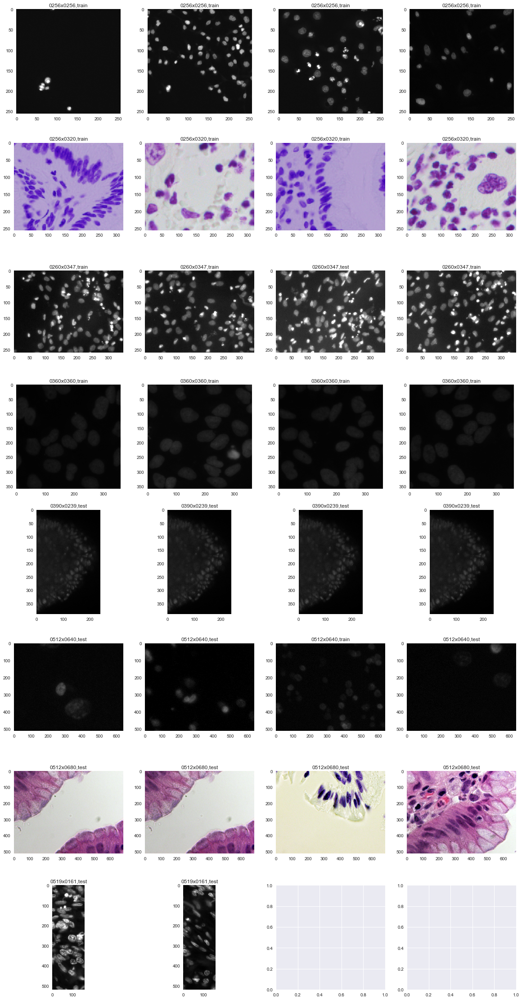

In [39]:
sample['label'] = sample[['shape','train_or_test']].apply(lambda x: '{},{}'.format(x[0],x[1]), axis=1)
show_row_col(sample.head(30),4,path_col='path',label_col='label',mode='file')

In [40]:
def rotate_bound(image, cX, cY, angle, box = None):
    # grab the dimensions of the image and then determine the
    # center
    (h, w) = image.shape[:2]
    #(cX, cY) = (w // 2, h // 2)

    # grab the rotation matrix (applying the negative of the
    # angle to rotate clockwise), then grab the sine and cosine
    # (i.e., the rotation components of the matrix)
    M = cv2.getRotationMatrix2D((cX, cY), -angle, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])

    # compute the new bounding dimensions of the image
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))

    # adjust the rotation matrix to take into account translation
    M[0, 2] += (nW / 2) - cX
    M[1, 2] += (nH / 2) - cY

    # perform the actual rotation and return the image
    return cv2.warpAffine(image, M, (nW, nH)) 

In [41]:
def rotate_points(points,center,origin,angle):
    rbox = np.array(points.copy())
    
    rbox[:,0] -= center[0]
    rbox[:,1] -= center[1]
    
    cos = math.cos(np.radians(angle))
    sin = math.sin(np.radians(angle))
    rmat = [[cos, -sin],
            [sin, cos]]
    
    rbox = np.dot(np.matrix(rbox),rmat)
    
    rbox[:,0] += origin[0]  
    rbox[:,1] += origin[1]
    
    return np.array(rbox)

In [42]:
def extract(mask, image, mask_id, image_id, frame=3):
    _, contours, _ = cv2.findContours(mask, CONTOUR_EXTRACT_MODE, cv2.CHAIN_APPROX_NONE)

    data = []
    
    if len(image.shape) > 2:
        all_nuclei = image.copy()
        for i in range(image.shape[2]):
            all_nuclei[:,:,i] = np.bitwise_and(all_nuclei[:,:,i],mask)
    else:
        all_nuclei = np.bitwise_and(image,mask)

    for contour in contours:
        ((cx, cy), r) =  cv2.minEnclosingCircle(contour)
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        angle = rect[2]
    
        x1 = max(0,math.floor(cx-r-frame))
        y1 = max(0,math.floor(cy-r-frame))

        x2 = min(mask.shape[1],math.ceil(cx+r+frame+1))
        y2 = min(mask.shape[0],math.ceil(cy+r+frame+1))

        sq_mask =  mask[y1:y2,x1:x2]
        square =  all_nuclei[y1:y2,x1:x2,:]
        
        offset_cx = int(cx-x1)
        offset_cy = int(cy-y1)
        
        # offset the points
        box[:,0] -= x1
        box[:,1] -= y1
        # print(box)
        
        rotated = rotate_bound(sq_mask,offset_cx,offset_cy,-angle)
        nuclei = rotate_bound(square,offset_cx,offset_cy,-angle)
        rbox = rotate_points(box,(offset_cx,offset_cy),(nuclei.shape[1]/2,nuclei.shape[0]/2),angle)

        xmin, xmax = max(0,math.floor(min(rbox[:,0]))), math.ceil(max(rbox[:,0]))
        ymin, ymax = max(0,math.floor(min(rbox[:,1]))), math.ceil(max(rbox[:,1]))

        #print(xmin,xmax,ymin,ymax)
        nuclei = nuclei[ymin:ymax+1,xmin:xmax+1]
        h = ymax - ymin + 1
        w = xmax - xmin + 1
        if h > w:
            nuclei = rotate_bound(nuclei,int(w/2),int(h/2),90)
            angle = angle -90
            #h,w = nuclei.shape
            
        data.append({
            'image_id':image_id,
            'mask_id':mask_id,
            'nuclei':nuclei.tolist(),
            'width':nuclei.shape[1],
            'height':nuclei.shape[0],
            'cx':cx,
            'cy':cy,
            'square':square.tolist(),
            'offset_cx':offset_cx,
            'offset_cy':offset_cy,
            'radius':r,
            'box':box.tolist(),
            'angle':angle
        })
        
    return(data)

In [43]:
# lambda function to flatten a list

flatten = lambda l: [item for sublist in l for item in sublist]

In [44]:
def get_masks(image_id, prefix, invert=False, enhance=True):
    
    image_file = '{}/{}/images/{}.png'.format(prefix,image_id,image_id)
    image = cv2.imread(image_file) #, cv2.IMREAD_GRAYSCALE)
    image = cv2.cvtColor(image,cv2.COLOR_BGRA2RGB)
    
    if enhance:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3,3))
        for channel in range(image.shape[2]):
            image[:,:,channel] = clahe.apply(image[:,:,channel])

    if invert:
        image = np.invert(image)

    data = []
    mask_files = glob.glob(os.path.join('{}/{}/masks/'.format(prefix,image_id),'*.png'))
    
    index = 0
    for mask_file in mask_files:
        mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
        mask_id = os.path.basename(mask_file).split('.')[0]
        info = extract(mask, image, mask_id, image_id)
        
        data.append(info)
        index +=1 
    
    return(flatten(data))

In [45]:
train = df[df['train_or_test'] == 'train'][['id','invert']]

In [46]:
prefix = './stage1_train'
data = train.apply(lambda x: get_masks(x[0],prefix,x[1]), axis = 1)
data = flatten(data)
masks = pd.DataFrame(data)
mdf = masks.merge(df[['id','shape','invert']],how='inner', on=None, left_on = 'image_id', right_on='id')

In [47]:
print(len(masks),list(masks.columns))

30385 ['angle', 'box', 'cx', 'cy', 'height', 'image_id', 'mask_id', 'nuclei', 'offset_cx', 'offset_cy', 'radius', 'square', 'width']


In [48]:
mdf = masks.merge(df[['id','shape','invert']],how='inner', on=None, left_on = 'image_id', right_on='id')

In [49]:
def show_process(df):
    
    rows = len(df)
    fix, ax = plt.subplots(rows,6,figsize=(5*6,5*rows))
    for row,data in df.iterrows():

        image_file = '{}/{}/images/{}.png'.format(prefix,data['image_id'],data['image_id'])
        image = cv2.imread(image_file)
        image = cv2.cvtColor(image,cv2.COLOR_BGRA2RGB)
        show_image(ax[row,0],'original {}'.format(data['shape']),image)

        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3,3))
        enhanced = image.copy()
        for channel in range(enhanced.shape[2]):
            enhanced[:,:,channel] = clahe.apply(enhanced[:,:,channel])

        circled = cv2.circle(enhanced, (int(data['cx']),int(data['cy'])), 
                             int(data['radius']+3), 
                             color=(255,255,0), thickness=3) 
        show_image(ax[row,1],'enhanced',circled)

        mask_file = '{}/{}/masks/{}.png'.format(prefix,data['image_id'],data['mask_id'])
        mask = cv2.imread(mask_file,cv2.IMREAD_GRAYSCALE)
        
        circled = cv2.cvtColor(mask,cv2.COLOR_GRAY2RGB)
        circled = cv2.circle(circled, (int(data['cx']),int(data['cy'])), 
                             int(data['radius']+3), 
                             color=(255,255,0), thickness=3) 

        show_image(ax[row,2],'mask',circled)

        masked_image = enhanced.copy()
        if data['invert']:
            masked_image = np.invert(masked_image)

        for channel in range(masked_image.shape[2]):
            masked_image[:,:,channel] = np.bitwise_and(masked_image[:,:,channel],mask)

        circled = cv2.circle(masked_image, (int(data['cx']),int(data['cy'])), 
                             int(data['radius']+3), 
                             color=(0,255,255), thickness=3) 
        show_image(ax[row,3],'inverted & masked',cv2.cvtColor(circled,cv2.COLOR_BGRA2RGB))

        square = np.array(data['square'], dtype=np.uint8)
        circled = cv2.circle(square, (int(data['offset_cx']),int(data['offset_cy'])), 
                             int(data['radius']+3), 
                             color=(255,255,0), thickness=1) 
        
        show_image(ax[row,4],'Cropped',circled)

        nuclei = np.array(data['nuclei'], dtype=np.uint8)
        show_image(ax[row,5],'rotated and clipped',nuclei)

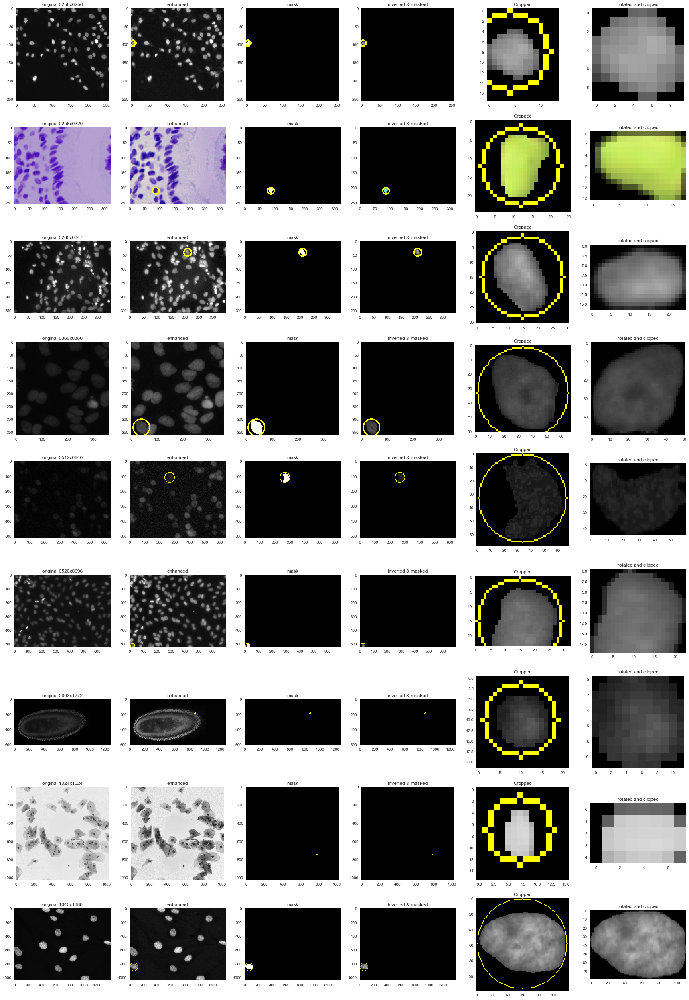

In [50]:
detail = mdf[mdf['image_id'].isin(sample['id'])]
sample_one = n_of_each(detail,n=1)

show_process(sample_one)

In [51]:
nuclei_by_mask = mdf[['mask_id','image_id']].groupby(['mask_id']).count().reset_index()
nuclei_by_mask = nuclei_by_mask.rename(columns={"image_id": "count"})
nuclei_by_mask = nuclei_by_mask[nuclei_by_mask['count']>1]
nuclei_by_mask = nuclei_by_mask.sort_values(by=['count'], ascending=False).reset_index()

nuclei_by_mask.head()

,index,mask_id,count
0,11017,5e6e650a28e22f651817b2edeacbf93a960adf633f1dbe...,14
1,3146,1aeeabd9b2b9f2e6869bf1f57eb6c7e2ef18a63e52efc3...,13
2,10082,55f0ae548d4e94dd750c50ece134492949d698344c192f...,12
3,29017,fbc8d0aebabdcff24200afe3717f7b413f97aa1795d697...,11
4,9155,4e62700df93933f913a25146492dc583705b8495f6a984...,11


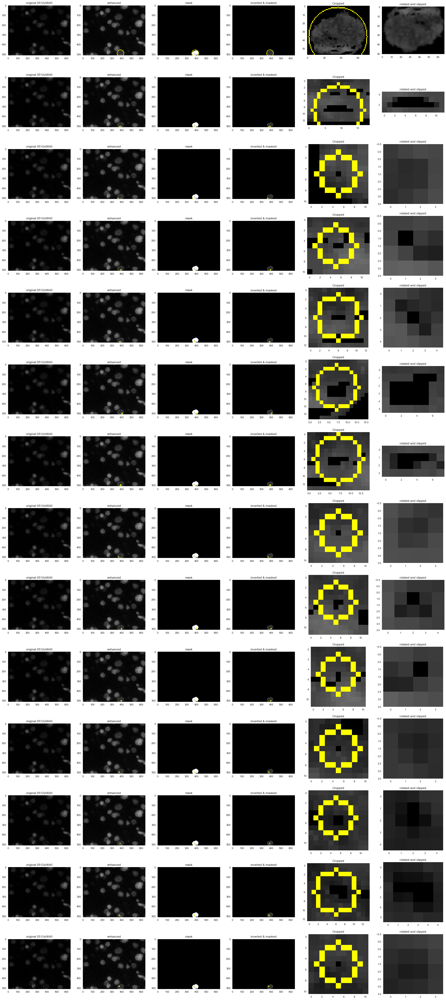

In [52]:
data = mdf[mdf['mask_id'] == nuclei_by_mask.loc[0]['mask_id']].copy().reset_index()

show_process(data)

In [53]:

holes_in_masks = mdf[mdf['mask_id'].isin(nuclei_by_mask['mask_id'].unique())].copy().reset_index()

In [54]:
CONTOUR_EXTRACT_MODE = cv2.RETR_EXTERNAL

In [55]:
masks_info = os.path.join(OUTPUT_PATH,'masks.json')
data = train.apply(lambda x: get_masks(x[0],prefix,x[1]), axis = 1)
data = flatten(data)
masks = pd.DataFrame(data) 
with open(masks_info, 'w') as outfile:
    json.dump(data, outfile)

In [56]:
mdf = masks.merge(df[['id','shape','invert']],how='inner', on=None, left_on = 'image_id', right_on='id')
len(mdf)

29472

In [57]:
count_by_mask = mdf[['mask_id','image_id']].groupby(['mask_id']).count().reset_index()
count_by_mask = count_by_mask.rename(columns={"image_id": "count"})

count_by_mask = count_by_mask[count_by_mask['count']>1].copy().reset_index()
count_by_mask

,index,mask_id,count
0,1481,0cc0c8466c81b6e2a26d2779ba8be57616a2335dc87922...,2
1,4616,27a4c059dd8c8ce70de7c382e6de88bf197d9b8dde17b7...,2
2,8458,48a7e471b49e92e4a9b94f949e36359513cb8002dcd6f3...,2
3,9652,52a0da01e7292a55903c626bad32cb224d74013aed8dce...,2
4,11405,61d68aff301c235ee2c0c706b1ad198130114e9a499d27...,2
5,12796,6e358226ece7da40fd13b6ccab7e9f80e6c9f7a55334e9...,2
6,16825,91c1e7ee69bb7b59fa6e995d5bd38f380e4bc4153ad120...,2
7,19079,a5467a779ae969d13a11c96edf1d79fcb3557bf8747353...,2
8,20175,af4d6ff17fa7b41de146402e12b3bab1f1fe3c1e6f37da...,2
9,22410,c2e874308f92924df63fdf62fa335bf32c4ba67d7348e2...,2


In [58]:
split_masks = mdf[mdf['mask_id'].isin(count_by_mask['mask_id'].unique())].copy().reset_index()

show_process(split_masks)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [59]:
def tag_anomaly(label,df):
    if type(df) == 'pandas.core.series.Series':
        items = df[['image_id','mask_id']].copy()
    else:
        items = df[['image_id','mask_id']].copy().drop_duplicates()
    items['issue'] = label
    
    return(items)

In [60]:
anomalies = pd.DataFrame()
anomalies = anomalies.append(tag_anomaly('Holes in mask',holes_in_masks))
anomalies = anomalies.append(tag_anomaly('Split mask',split_masks))

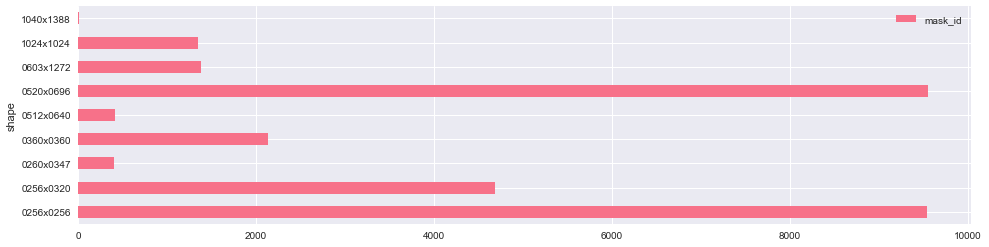

In [61]:
agg = mdf[['shape','mask_id']].groupby(['shape']).count()
#agg.columns = agg.columns.droplevel()
agg.plot.barh(stacked=True,figsize=(16,4))
plt.show()

In [62]:

len(mdf[mdf['shape']=='1040x1388'])

14

In [63]:
agg = mdf[['shape','mask_id','image_id']].groupby(['shape','image_id']).count().reset_index()
agg.groupby(['shape'])['mask_id'].agg(['mean','min','max','std']).reset_index()

,shape,mean,min,max,std
0,0256x0256,28.568862,1,101,21.352744
1,0256x0320,41.839286,1,151,30.726211
2,0260x0347,81.600000,1,132,52.576611
3,0360x0360,23.483516,5,44,5.313218
4,0512x0640,31.615385,13,54,12.230689
5,0520x0696,103.826087,4,369,75.022577
6,0603x1272,229.500000,68,375,103.213856
7,1024x1024,84.062500,44,136,28.202763
8,1040x1388,14.000000,14,14,NaN


In [64]:
nuclei_sample = n_of_each(mdf,8)

In [65]:
len(nuclei_sample)/8

9.0

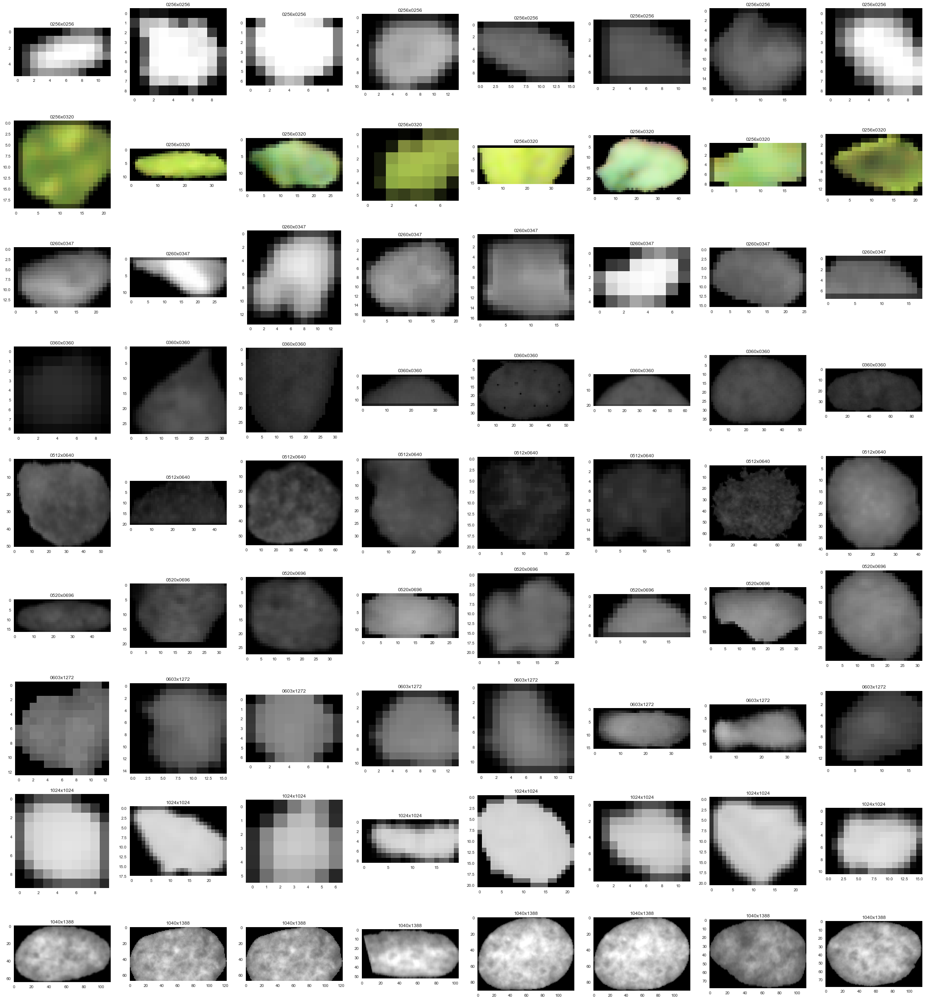

In [66]:
show_row_col(nuclei_sample,8,image_col='nuclei',label_col='shape',mode='image')

In [67]:
len(mdf[mdf['height'] < 3])

39

In [68]:
def show_mask(mdf, mask_id, prefix):
    image_id = mdf[mdf['mask_id']==mask_id]['image_id'].squeeze()
    image_file = '{}/{}/images/{}.png'.format(prefix,image_id,image_id)
    mask_file = '{}/{}/masks/{}.png'.format(prefix,image_id,mask_id) 
    
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image,cv2.COLOR_BGRA2RGB)
    
    mask = cv2.imread(mask_file,cv2.IMREAD_GRAYSCALE)
    mask = cv2.cvtColor(mask,cv2.COLOR_GRAY2RGB)
    
    fig,ax = plt.subplots(1,2,figsize = (20,20))
    ax[0].grid(None)
    ax[0].imshow(image)
    ax[1].set_title('Image')
    ax[1].grid(None)
    ax[1].imshow(mask)
    ax[1].set_title('Mask')

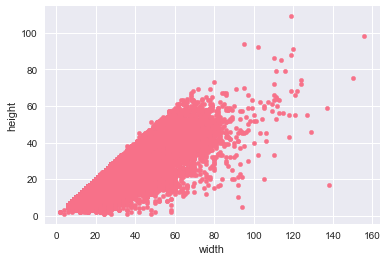

In [69]:
mdf.plot.scatter('width','height')
plt.show()

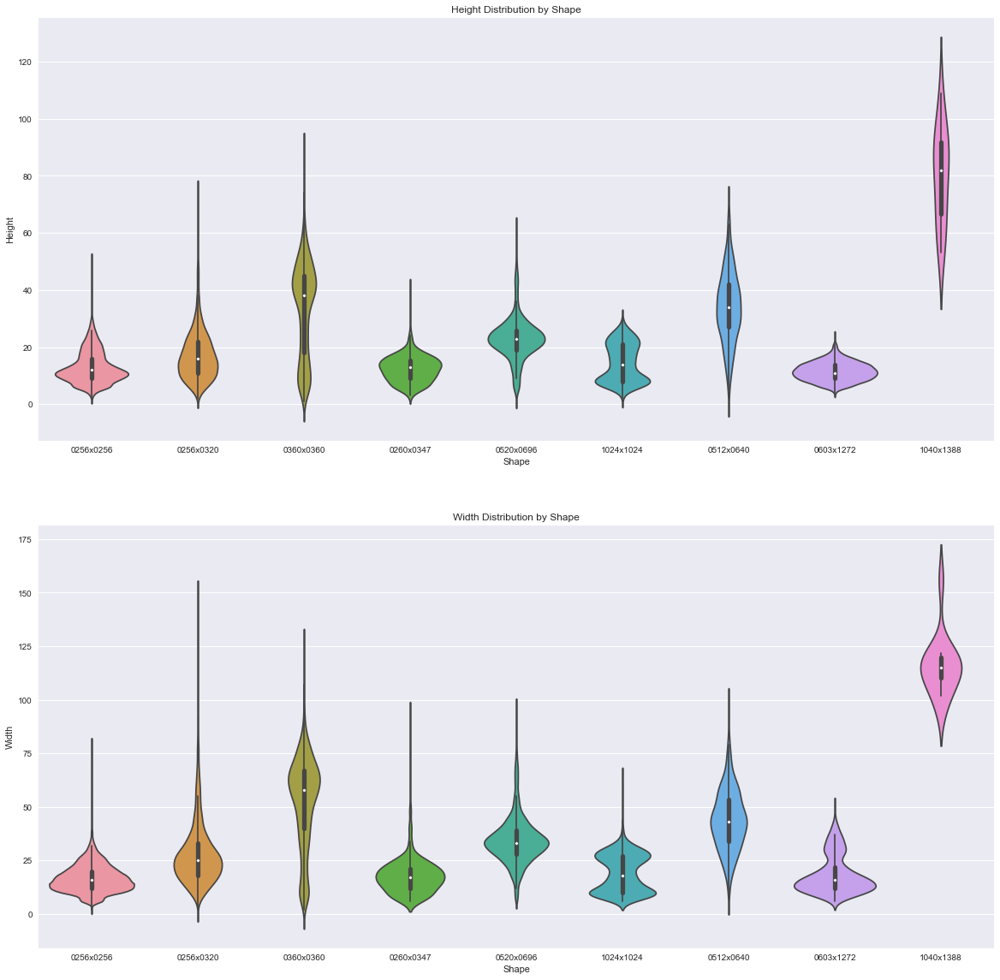

In [70]:
fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=mdf, ax = axes[0])
axes[0].set_title('Height Distribution by Shape')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=mdf, ax = axes[1])
axes[1].set_title('Width Distribution by Shape')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()

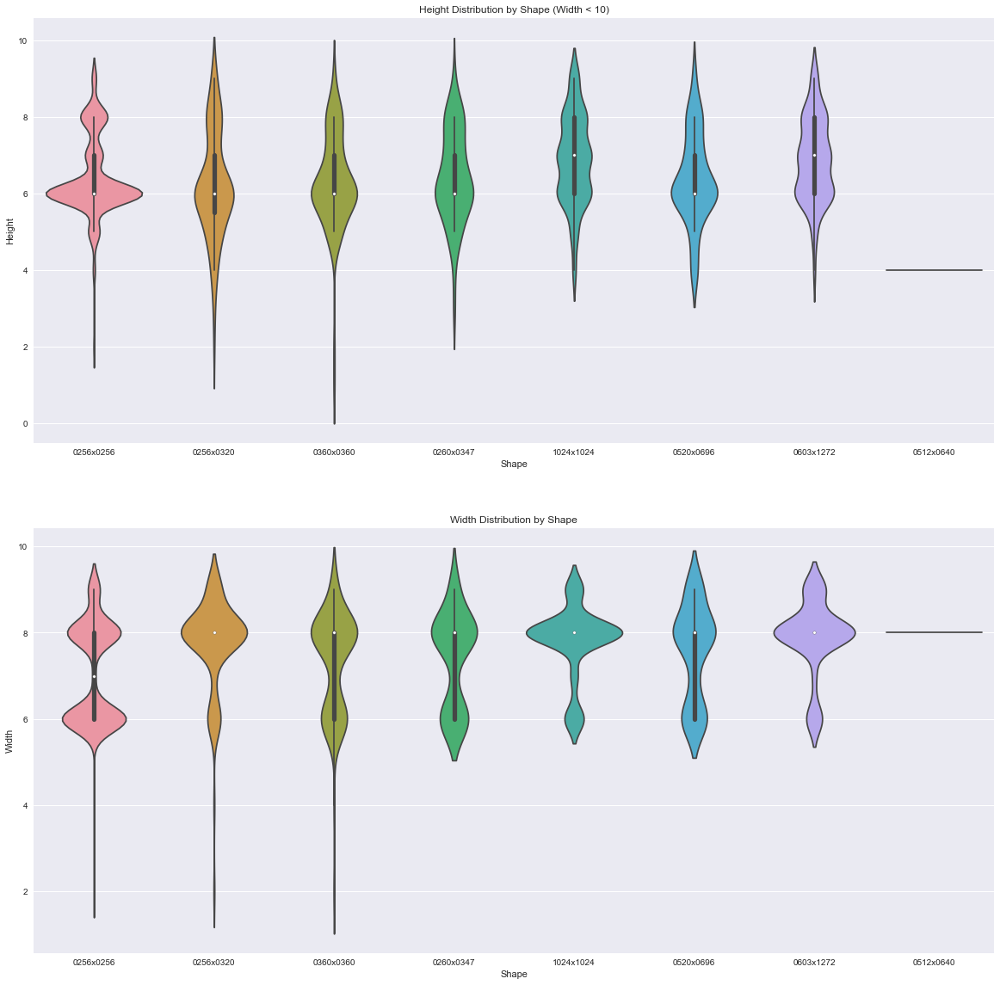

In [71]:
small = mdf[mdf['width'] < 10]

fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=small, ax = axes[0])
axes[0].set_title('Height Distribution by Shape (Width < 10)')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=small, ax = axes[1])
axes[1].set_title('Width Distribution by Shape')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()

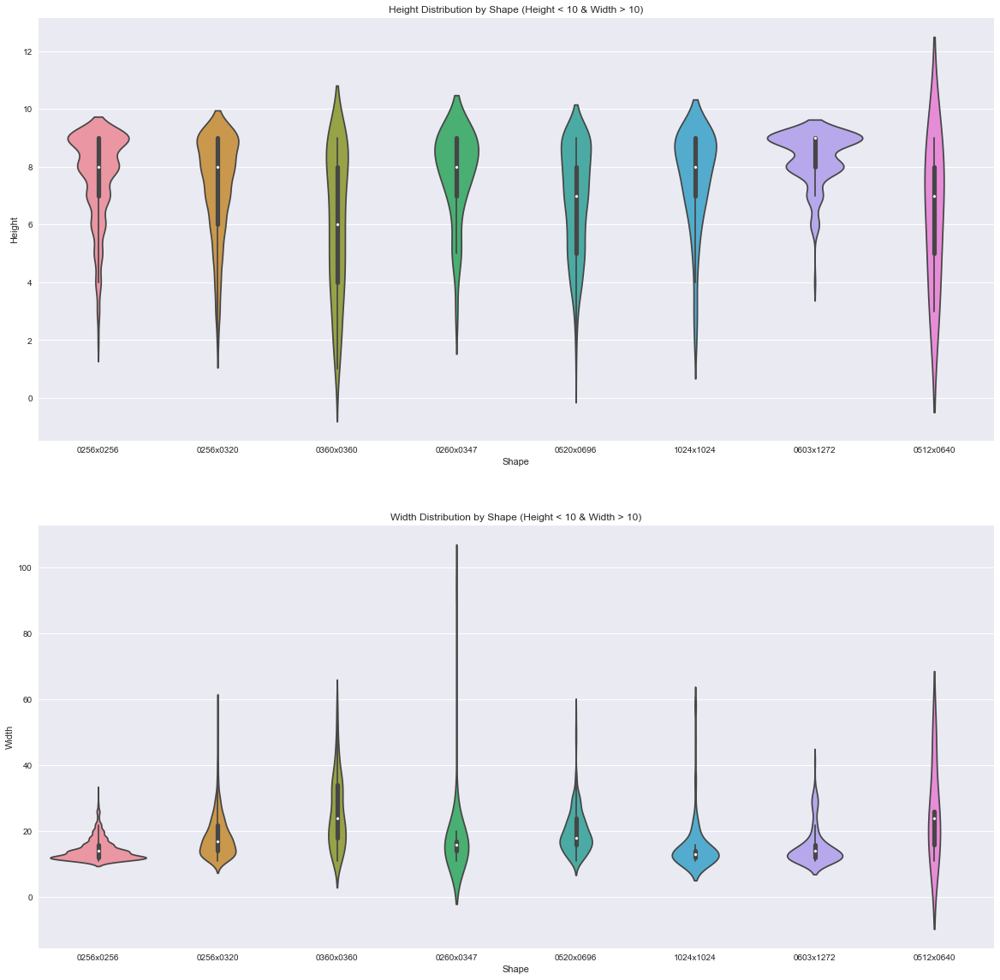

In [72]:
small = mdf[mdf['height'] < 10]
small = small[small['width']> 10]

fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=small, ax = axes[0])
axes[0].set_title('Height Distribution by Shape (Height < 10 & Width > 10)')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=small, ax = axes[1])
axes[1].set_title('Width Distribution by Shape (Height < 10 & Width > 10)')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()

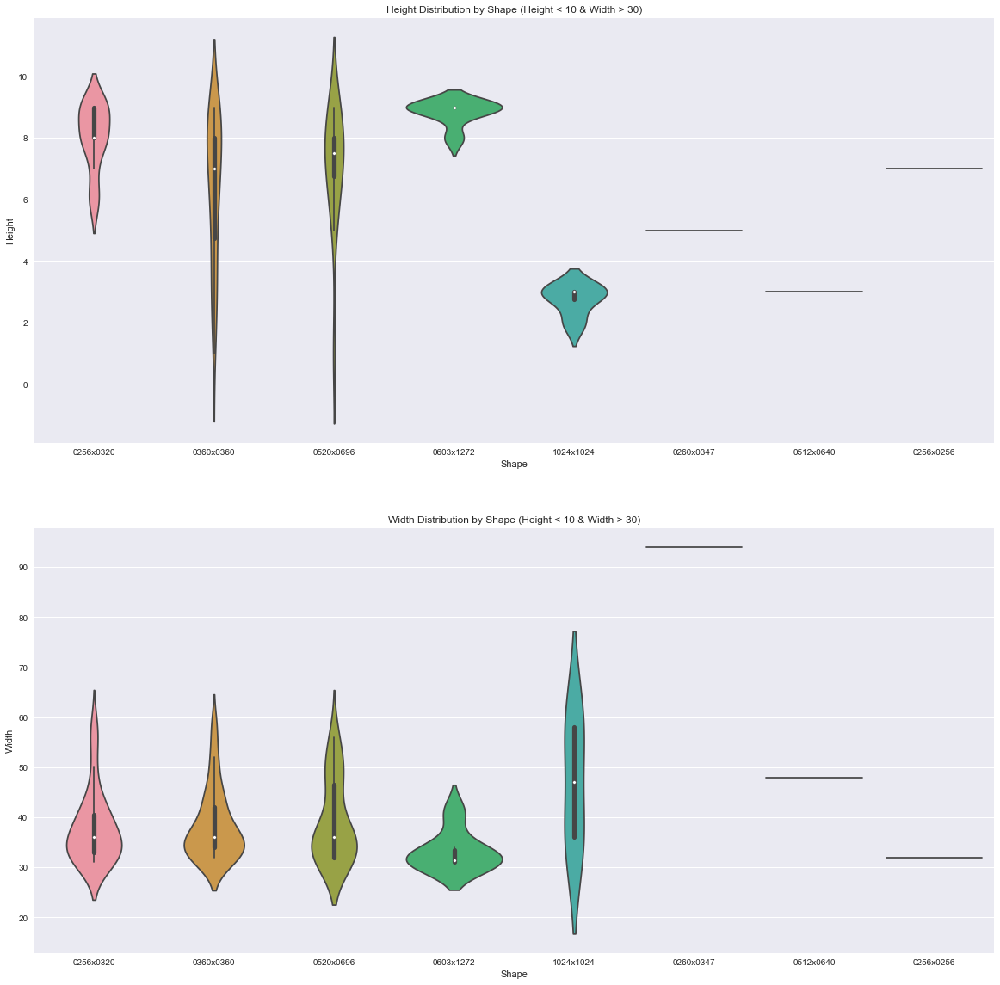

In [73]:
small = mdf[(mdf['height'] < 10) & (mdf['width']> 30)]

fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=small, ax = axes[0])
axes[0].set_title('Height Distribution by Shape (Height < 10 & Width > 30)')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=small, ax = axes[1])
axes[1].set_title('Width Distribution by Shape (Height < 10 & Width > 30)')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()

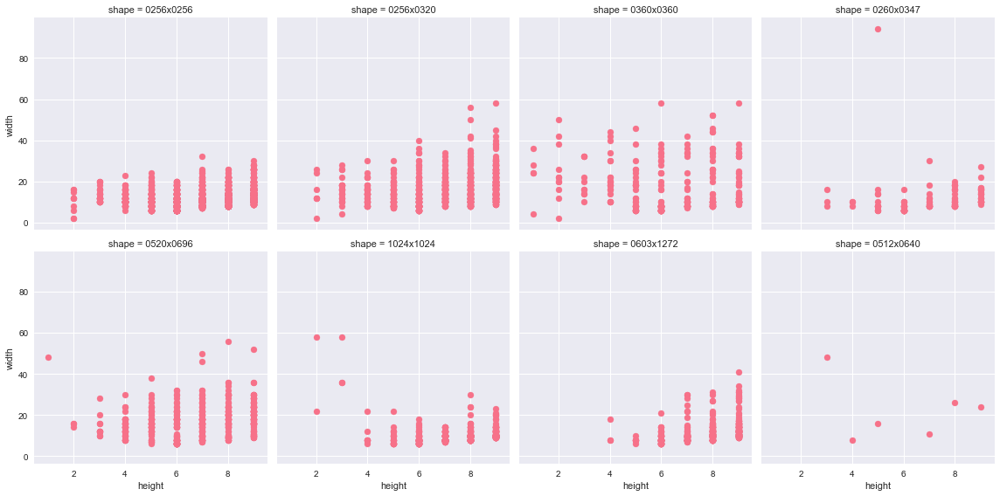

In [74]:
small = mdf[mdf['height'] < 10]

g = sns.FacetGrid(small,col="shape", col_wrap=4, size = 4)
g = g.map(plt.scatter, "height", "width")

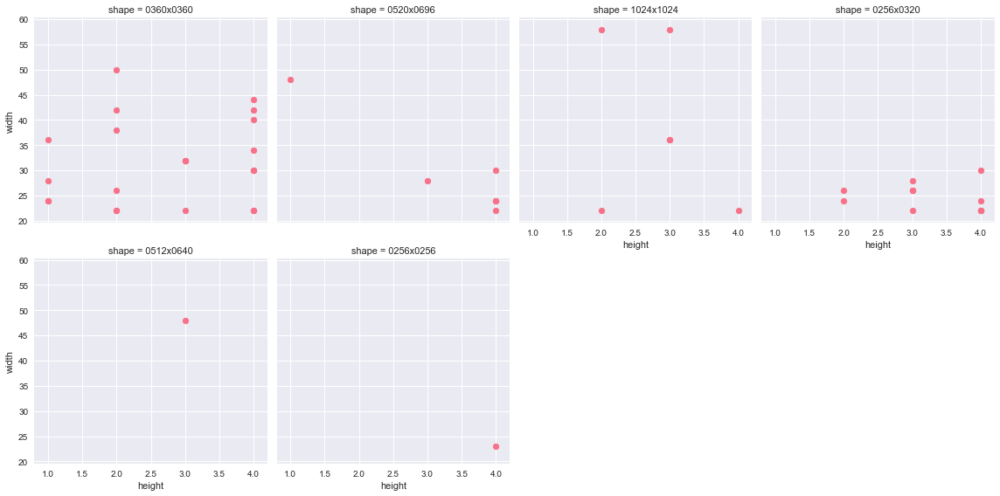

In [75]:
small = mdf[(mdf['height'] < 5) & (mdf['width'] > 20)]

g = sns.FacetGrid(small,col="shape", col_wrap=4, size = 4)
g = g.map(plt.scatter, "height", "width")

In [76]:
len(small)

47

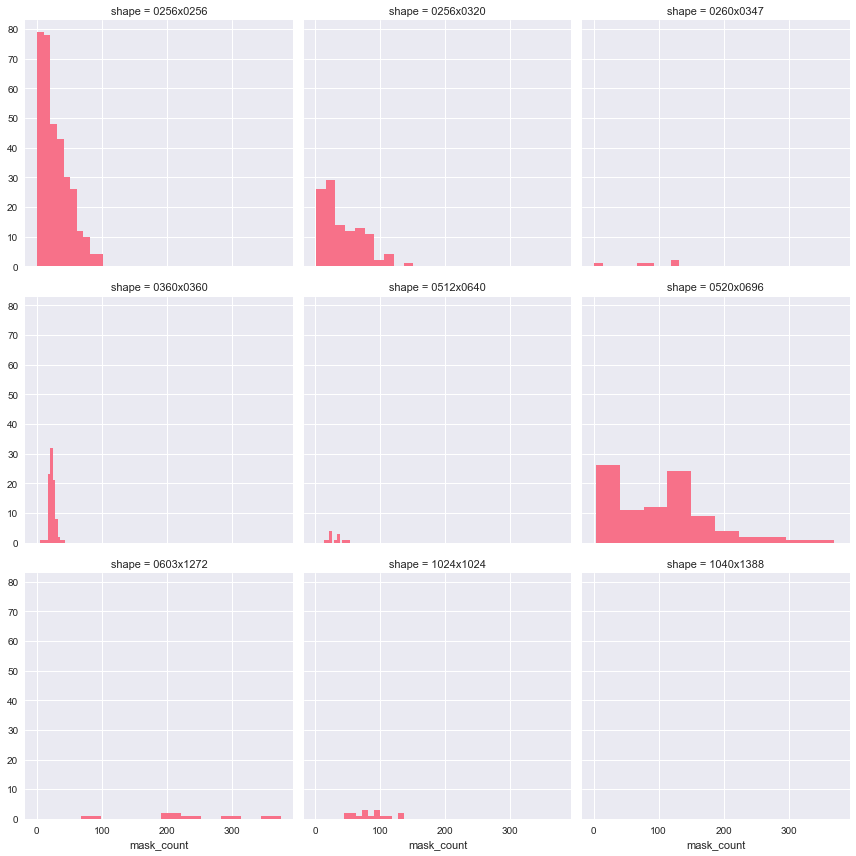

In [77]:
agg = mdf[['image_id','shape','mask_id']].groupby(['shape','image_id']).count().reset_index()
agg = agg.rename(columns={'mask_id':'mask_count'})

g = sns.FacetGrid(agg ,col="shape", size = 4,  sharex="none", col_wrap=3)
g = g.map(plt.hist,'mask_count')

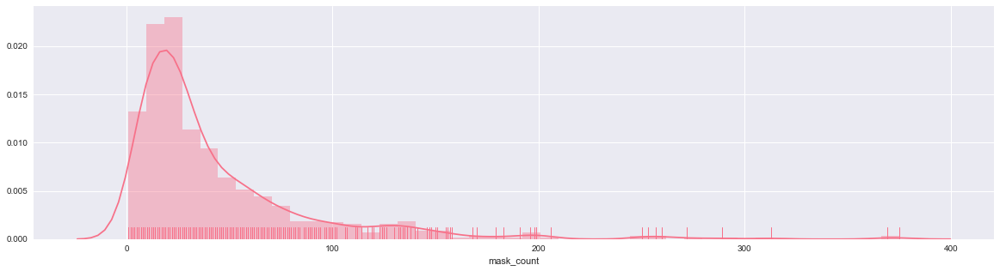

In [78]:
agg = mdf[['image_id','mask_id']].groupby(['image_id']).count().reset_index()
agg = agg.rename(columns={'mask_id':'mask_count'})

fig, ax = plt.subplots(figsize=(20,5))
sns.distplot(agg['mask_count'],ax=ax,rug=True)
plt.show()

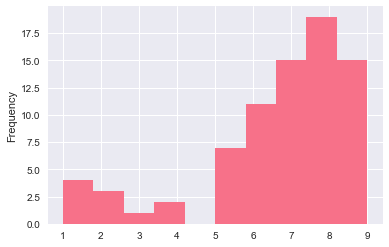

In [79]:
agg.loc[agg['mask_count']<10,'mask_count'].plot.hist()
plt.show()

In [80]:
agg[agg['mask_count']<4]

,image_id,mask_count
94,220b37f4ca7cab486d2b71cd87a46ee7411a5aa142799d...,1
241,58c593bcb98386e7fd42a1d34e291db93477624b164e83...,2
332,7b38c9173ebe69b4c6ba7e703c0c27f39305d9b2910f46...,1
351,84eeec681987753029eb83ea5f3ff7e8b5697783cdb203...,1
385,93c5638e7e6433b5c9cc87c152bcbe28873d2f9d6a392c...,1
462,af576e8ec3a8d0b57eb6a311299e9e4fd2047970d3dd9d...,2
505,bf4a61bb81589c9a67e3343408befd3e135af5e88b50c1...,3
602,e5aeb5b3577abbebe8982b5dd7d22c4257250ad3000661...,2


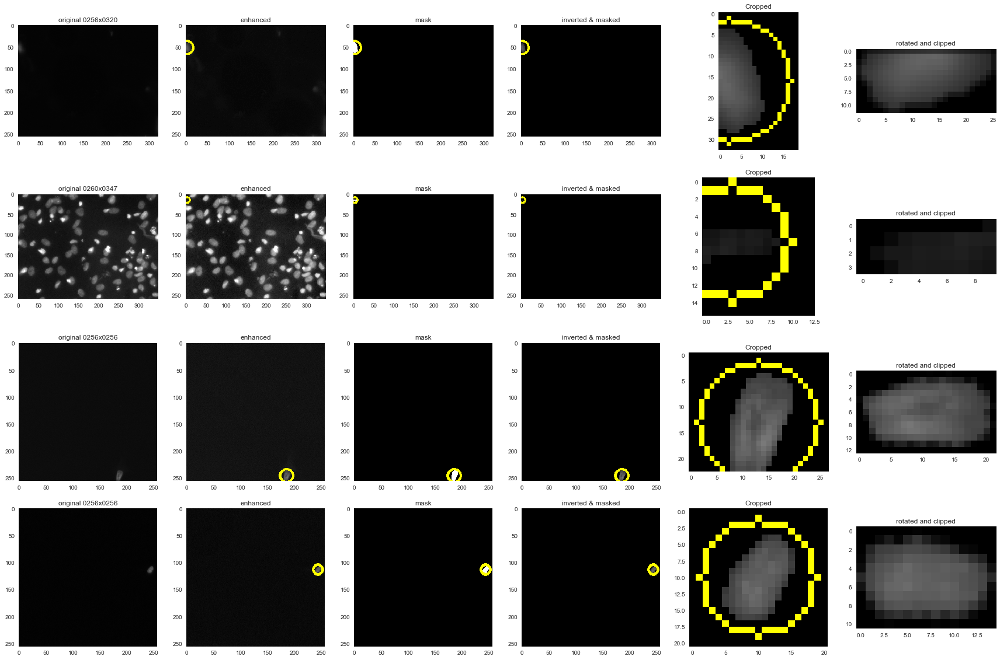

In [81]:
low_count = mdf[mdf['image_id'].isin(agg.loc[agg['mask_count']<2,'image_id'].unique())].copy().reset_index()

show_process(low_count)

In [82]:
anomalies = anomalies.append(tag_anomaly('Invalid Masks',low_count.loc[2]))

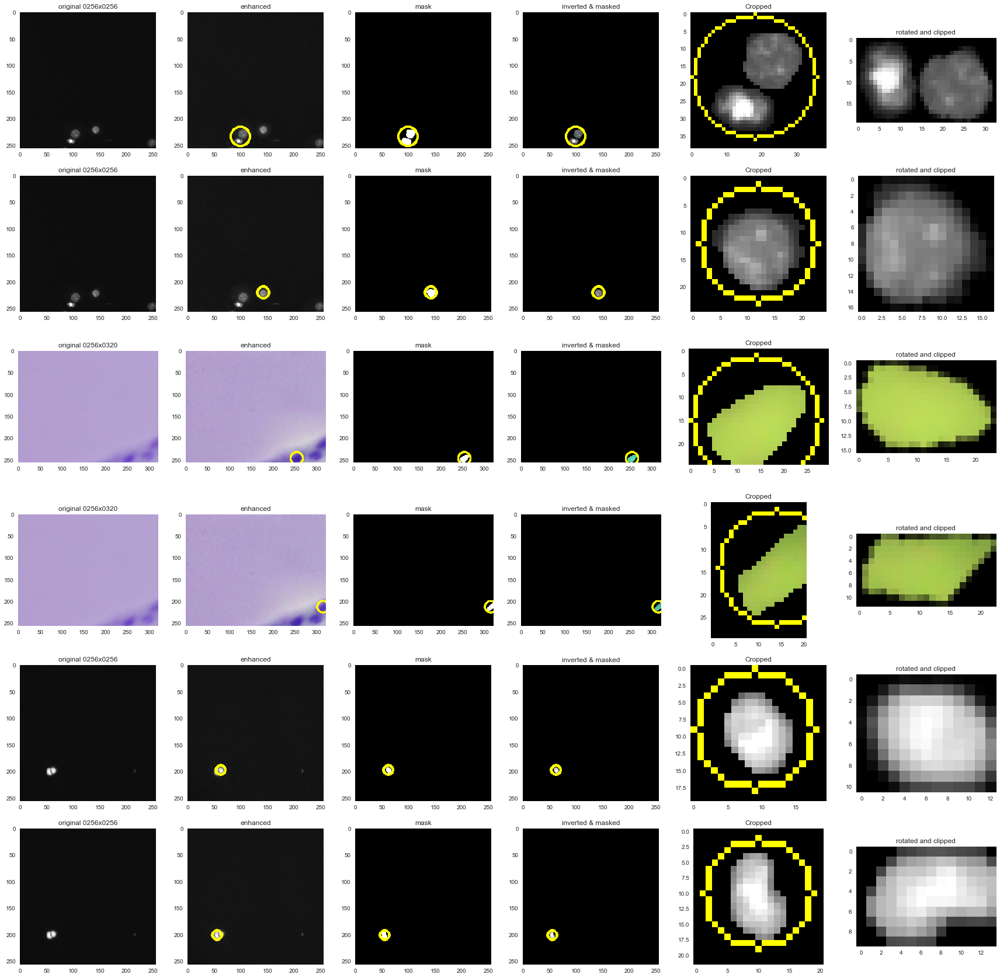

In [83]:
low_count = mdf[mdf['image_id'].isin(agg.loc[agg['mask_count']==2,'image_id'].unique())].copy().reset_index()

show_process(low_count)

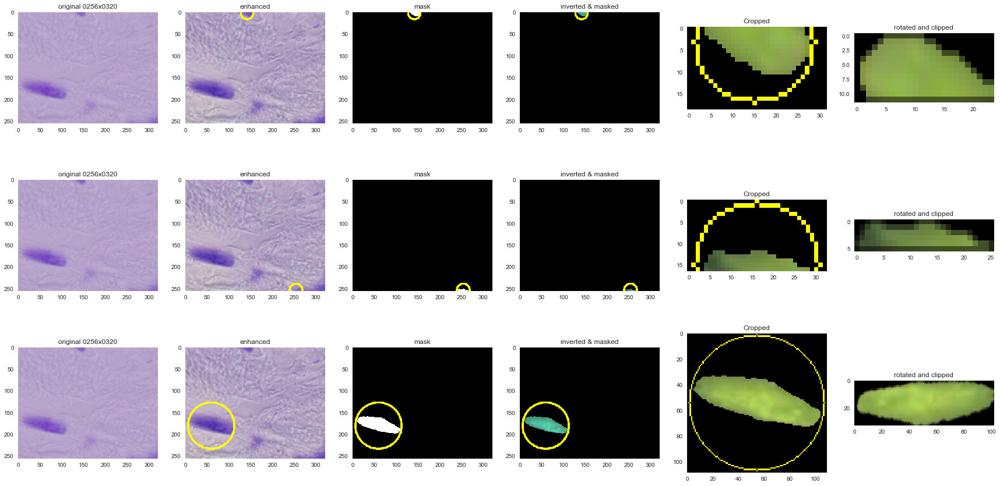

In [84]:
low_count = mdf[mdf['image_id'].isin(agg.loc[agg['mask_count']==3,'image_id'].unique())].copy().reset_index()

show_process(low_count)

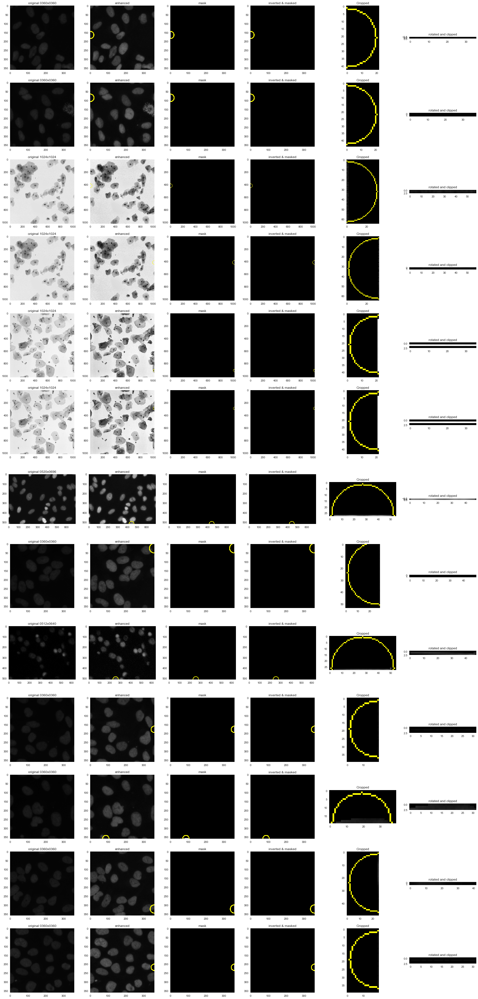

In [85]:

abnormal = mdf[(mdf['height'] < 4) & 
               (mdf['width'] > 30)].copy().reset_index()
show_process(abnormal)

In [86]:
anomalies = anomalies.append(tag_anomaly('Look like lines',abnormal))

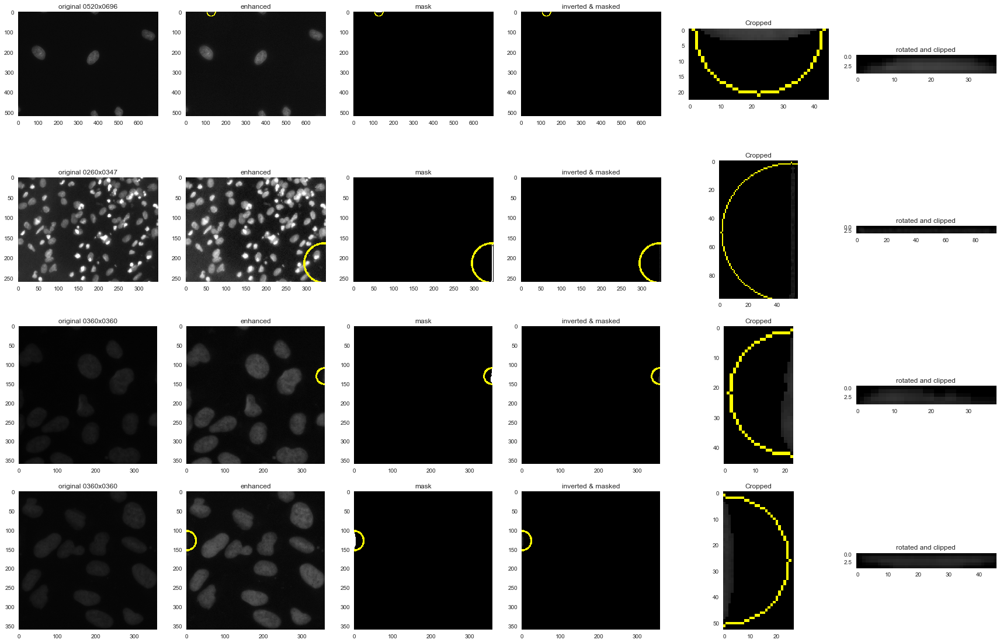

In [87]:

abnormal = mdf[(mdf['height'] < 6) & 
               (mdf['height'] > 4) & 
               (mdf['width'] > 30)].copy().reset_index()
len(abnormal)
show_process(abnormal)

In [88]:

anomalies = anomalies.append(tag_anomaly('Look like lines',abnormal.loc[0]))

In [89]:
with open(os.path.join(OUTPUT_PATH,'anomalies.json'), 'w') as outfile:
    json.dump(anomalies.to_json(orient='records'), outfile)

In [90]:
agg = anomalies[['issue','mask_id']].groupby('issue').count()
agg = agg.rename(columns={'mask_id':'counts'})
agg

,counts
issue,
Holes in mask,436
Invalid Masks,1
Look like lines,14
Split mask,11
